<div style="background-color:#2E87A4 ;color:#FDFDFD;padding:20px;border:1px solid #3184BB;text-align:center;">
<p><font size="12" face="Lora"><i>Sentiment Analysis - Text Data</i></font> </p>
</div>


**EXTRACTING ZIPPED DATA**

In [ ]:
#!unzip '/content/drive/MyDrive/NLP project/txt_reviews.zip' -d '/content/text_data'

Streaming output truncated to the last 5000 lines.
  inflating: /content/text_data/txt_reviews/review_95499.txt  
  inflating: /content/text_data/txt_reviews/review_955.txt  
  inflating: /content/text_data/txt_reviews/review_9550.txt  
  inflating: /content/text_data/txt_reviews/review_95500.txt  
  inflating: /content/text_data/txt_reviews/review_95501.txt  
  inflating: /content/text_data/txt_reviews/review_95502.txt  
  inflating: /content/text_data/txt_reviews/review_95503.txt  
  inflating: /content/text_data/txt_reviews/review_95504.txt  
  inflating: /content/text_data/txt_reviews/review_95505.txt  
  inflating: /content/text_data/txt_reviews/review_95506.txt  
  inflating: /content/text_data/txt_reviews/review_95507.txt  
  inflating: /content/text_data/txt_reviews/review_95508.txt  
  inflating: /content/text_data/txt_reviews/review_95509.txt  
  inflating: /content/text_data/txt_reviews/review_9551.txt  
  inflating: /content/text_data/txt_reviews/review_95510.txt  
  inflat

In [ ]:
import os
file_names = os.listdir('/content/text_data/txt_reviews')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
print('Total number of files in the dataset:', len(file_names))

Total number of files in the dataset: 568454


In [ ]:
import pandas as pd

**DATAFRAME CREATION**

In [ ]:
root_dir =r'/content/text_data/txt_reviews'
file_names  = os.listdir(r'/content/text_data/txt_reviews')
a = []
b = []
c = []
d = []
e = []
x = []
g = []
h = []
i = []

for review in file_names:
    with open(os.path.join(root_dir,review),'rt') as f:
        lines = f.readlines()
        a.append(lines[0].split(":")[1].strip('\n'))
        b.append(lines[1].split(":")[1].strip('\n'))
        c.append(lines[2].split(":")[1].strip('\n'))
        d.append(lines[3].split(":")[1].strip('\n'))
        e.append(lines[4].split(":")[1].strip('\n'))
        x.append(lines[5].split(":")[1].strip('\n'))
        g.append(lines[6].split(":")[1].strip('\n'))
        h.append(lines[7].split(":")[1].strip('\n'))
        i.append(lines[8].split(":")[1].strip('\n'))

df = pd.DataFrame({'ProductId':a,
                 'UserId':b,
                 'ProfileName':c,
                 'HelpfulnessNumerator':d,
                 'HelpfulnessDenominator':e,
                 'Score':x,
                 'Time':g,
                 'ReviewSummary':h,
                 'ReviewText':i})

df.head()

,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,B000GW68Z8,ARO8G4WT40C88,"Mary M. Bayer ""mimi""",1,1,5,1168473600,Nothing but the best for the Troops!,My mom first sent my husband a box in his car...
1,B001CJSW5S,A2U5QVKBYK57OT,Lynn,0,0,4,1322438400,Pineapple Rum Cake,These cakes are moist and flavorful. Not too ...
2,B00020HHAO,A5CR6GP49HVEE,Stephanie,1,1,4,1295913600,"Not as rose-flavored as you might think, but ...",I bought this tea thinking it would taste lik...
3,B000F9Z1ZK,A132ETQPMHQ585,"Donna's Reviews ""I Love Shopping on Amazon!""",0,1,5,1331596800,Have always loved these...,Have always loved these...Snackwell's Devil's...
4,B001GQ3E2I,A1WXFUNDQBAJSH,JP,0,2,5,1324771200,Good stuff,My parents only eat this now because it doesn...


In [ ]:
# df.to_csv('/content/drive/MyDrive/NLP.csv') -- CONVERTING DATAFRAME TO CSV FORMAT

**IMPORTING REQUIRED LIBRARIES**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from datetime import datetime

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity="all"
import warnings

warnings.filterwarnings("ignore");
# for hd visualization
%config InlineBackend.figure_format="retina"


**LOADING THE DATA**

In [ ]:
Data=pd.read_csv(r'/content/drive/MyDrive/NLP.csv',index_col=0)
Data.head()
Data.shape

,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,B000GW68Z8,ARO8G4WT40C88,"Mary M. Bayer ""mimi""",1,1,5,1168473600,Nothing but the best for the Troops!,My mom first sent my husband a box in his car...
1,B001CJSW5S,A2U5QVKBYK57OT,Lynn,0,0,4,1322438400,Pineapple Rum Cake,These cakes are moist and flavorful. Not too ...
2,B00020HHAO,A5CR6GP49HVEE,Stephanie,1,1,4,1295913600,"Not as rose-flavored as you might think, but ...",I bought this tea thinking it would taste lik...
3,B000F9Z1ZK,A132ETQPMHQ585,"Donna's Reviews ""I Love Shopping on Amazon!""",0,1,5,1331596800,Have always loved these...,Have always loved these...Snackwell's Devil's...
4,B001GQ3E2I,A1WXFUNDQBAJSH,JP,0,2,5,1324771200,Good stuff,My parents only eat this now because it doesn...


(568454, 9)

### **DATA CLEANING**

In [ ]:
Data.head()

,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,B000GW68Z8,ARO8G4WT40C88,"Mary M. Bayer ""mimi""",1,1,5,1168473600,Nothing but the best for the Troops!,My mom first sent my husband a box in his car...
1,B001CJSW5S,A2U5QVKBYK57OT,Lynn,0,0,4,1322438400,Pineapple Rum Cake,These cakes are moist and flavorful. Not too ...
2,B00020HHAO,A5CR6GP49HVEE,Stephanie,1,1,4,1295913600,"Not as rose-flavored as you might think, but ...",I bought this tea thinking it would taste lik...
3,B000F9Z1ZK,A132ETQPMHQ585,"Donna's Reviews ""I Love Shopping on Amazon!""",0,1,5,1331596800,Have always loved these...,Have always loved these...Snackwell's Devil's...
4,B001GQ3E2I,A1WXFUNDQBAJSH,JP,0,2,5,1324771200,Good stuff,My parents only eat this now because it doesn...


In [ ]:
Data.shape

(568454, 9)

**HANDLING DUPLICATES**

In [ ]:
col_lst=Data[['UserId','ProfileName','HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score','Time','ReviewText']]
dff=pd.DataFrame(col_lst)
dff.duplicated().value_counts()

False    395730
True     172724
dtype: int64

In [ ]:
# Sorting data according to ProductId in ascending order
sorted_data=Data.sort_values('ProductId')
sorted_data.reset_index(drop=True)

,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,0006641040,AMX0PJKV4PPNJ,"E. R. Bird ""Ramseelbird""",71,72,4,1096416000,Read it once. Read it twice. Reading Chicken ...,"These days, when a person says, ""chicken soup..."
1,0006641040,A2P4F2UO0UMP8C,"Elizabeth A. Curry ""Lovely Librarian""",0,0,4,1096675200,MMMM chicken soup....,Summary
2,0006641040,A25ACLV5KPB4W,"Matt Hetling ""Matt""",0,1,4,1108425600,"Nice cadence, catchy rhymes",In June<br />I saw a charming group<br />of r...
3,0006641040,ASH0DZQQF6AIZ,tessarat,0,0,5,1325721600,A classic,I remembered this book from my childhood and ...
4,0006641040,A1S4A3IQ2MU7V4,"sally sue ""sally sue""",1,1,4,1191456000,chicken soup with rice months,This is a fun way for children to learn their...
...,...,...,...,...,...,...,...,...,...
568449,B009UOFTUI,AJVB004EB0MVK,D. Christofferson,0,0,1,1345852800,weak coffee not good for a premium product an...,"This coffee supposedly is premium, it tastes ..."
568450,B009UOFU20,AJVB004EB0MVK,D. Christofferson,0,0,1,1345852800,weak coffee not good for a premium product an...,"This coffee supposedly is premium, it tastes ..."
568451,B009UUS05I,ARL20DSHGVM1Y,Jamie,0,0,5,1331856000,Perfect,The basket was the perfect sympathy gift when...
568452,B009WSNWC4,AMP7K1O84DH1T,ESTY,0,0,5,1351209600,DELICIOUS,Purchased this product at a local store in NY...


In [ ]:
sorted_data[dff.duplicated()]

,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
551207,7310172001,A25THJL7YWYDNF,S. Rosenberg,0,0,5,1235260800,Don't buy it used,"Its a great product, and our dog loves them. ..."
327411,7310172001,A2PHHYUZMCR40S,"S. Israelson ""sunnyi49""",1,1,5,1276387200,Dogs go nuts for these liver treats,When I first go my Havanese puppy 1 1/2 years...
382678,7310172001,A3084RD2YNXRXJ,John L. Gonzales,1,1,5,1267574400,Rolls Royce of dog treats.......,"This product is a real bargain, considering t..."
317897,7310172001,A2R8ON13MVA57,Nanci M. Shea,0,0,5,1200700800,DELICOUS TREAT FOR DOGS,This is a Delicious treat for your dogs. I a...
376087,7310172001,AYS3F0L3VFP6G,Regan,0,0,5,1297900800,Great training treats!,Getting grain free treats for training usuall...
...,...,...,...,...,...,...,...,...,...
412132,B009SA5NNW,A3U0YIPTZX8DZ4,vee,0,0,4,1339977600,Re-Rating,"Okay, I jumped the gun, because they were sen..."
218997,B009SA5NNW,AVRU1Z8N59UZV,LIsa Fresch,0,1,1,1349654400,Walkers Crisps 6 pack,I ordered this product on Amazon to get some ...
531005,B009SA5NNW,A2XNO53D6J6322,dragenfli254,0,0,5,1317081600,Delish!,I had these wonderful chips in Ireland a few ...
554871,B009UOFTUI,AJVB004EB0MVK,D. Christofferson,0,0,1,1345852800,weak coffee not good for a premium product an...,"This coffee supposedly is premium, it tastes ..."


In [ ]:
Data=sorted_data.drop_duplicates(subset={'UserId','ProfileName','HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score','Time','ReviewText'}, keep='first')
Data.reset_index(drop=True,inplace=True)

**CHECK FOR MISSING VALUES**

In [ ]:
Data.isna().sum()

ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
ReviewSummary             0
ReviewText                0
dtype: int64

**CHECK FOR CORRUPTED DATA**

In [ ]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395730 entries, 230882 to 97716
Data columns (total 9 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   ProductId               395730 non-null  object
 1   UserId                  395730 non-null  object
 2   ProfileName             395730 non-null  object
 3   HelpfulnessNumerator    395730 non-null  int64 
 4   HelpfulnessDenominator  395730 non-null  int64 
 5   Score                   395730 non-null  int64 
 6   Time                    395730 non-null  int64 
 7   ReviewSummary           395730 non-null  object
 8   ReviewText              395730 non-null  object
dtypes: int64(4), object(5)
memory usage: 30.2+ MB


In [ ]:
# Converting Time column from int64 to datetime
Data['Time']=Data['Time'].astype('int')
Data['Time']=Data['Time'].apply(lambda x: datetime.fromtimestamp(x).isoformat())
Data['Time']=Data['Time'].apply(lambda x: ''.join(re.findall('(.*)T',x)))
Data['Time']=pd.to_datetime(Data['Time'])

In [ ]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395730 entries, 230882 to 97716
Data columns (total 9 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   ProductId               395730 non-null  object        
 1   UserId                  395730 non-null  object        
 2   ProfileName             395730 non-null  object        
 3   HelpfulnessNumerator    395730 non-null  int64         
 4   HelpfulnessDenominator  395730 non-null  int64         
 5   Score                   395730 non-null  int64         
 6   Time                    395730 non-null  datetime64[ns]
 7   ReviewSummary           395730 non-null  object        
 8   ReviewText              395730 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(5)
memory usage: 30.2+ MB


In [ ]:
# Practically, HelpfulnessNumerator should definetly be less than or equal to HelpfulnessDenominator. If any values do not follow this condition, 
# they must be removed from the Data.

Data=Data[Data.HelpfulnessNumerator<=Data.HelpfulnessDenominator]
Data.shape

(395728, 9)

In [ ]:
# Adding Helpfullness column
Data['Helpfulness'] = (Data.HelpfulnessNumerator/Data.HelpfulnessDenominator)*100
Data=Data.fillna(0)

In [ ]:
Data.head()

,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText,Helpfulness
0,0006641040,AMX0PJKV4PPNJ,"E. R. Bird ""Ramseelbird""",71,72,4,1096416000,Read it once. Read it twice. Reading Chicken ...,"These days, when a person says, ""chicken soup...",98.611111
1,0006641040,A2P4F2UO0UMP8C,"Elizabeth A. Curry ""Lovely Librarian""",0,0,4,1096675200,MMMM chicken soup....,Summary,0.000000
2,0006641040,A25ACLV5KPB4W,"Matt Hetling ""Matt""",0,1,4,1108425600,"Nice cadence, catchy rhymes",In June<br />I saw a charming group<br />of r...,0.000000
3,0006641040,ASH0DZQQF6AIZ,tessarat,0,0,5,1325721600,A classic,I remembered this book from my childhood and ...,0.000000
4,0006641040,A1S4A3IQ2MU7V4,"sally sue ""sally sue""",1,1,4,1191456000,chicken soup with rice months,This is a fun way for children to learn their...,100.000000


In [ ]:
Data.duplicated().value_counts()
Data.isna().sum()

False    395730
dtype: int64

ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
ReviewSummary             0
ReviewText                0
Helpfulness               0
dtype: int64

**OUTLIERS**

In [ ]:
Data.skew()

HelpfulnessNumerator      39.725160
HelpfulnessDenominator    34.258779
Score                     -1.449517
Time                      -1.240470
Helpfulness                0.309406
dtype: float64

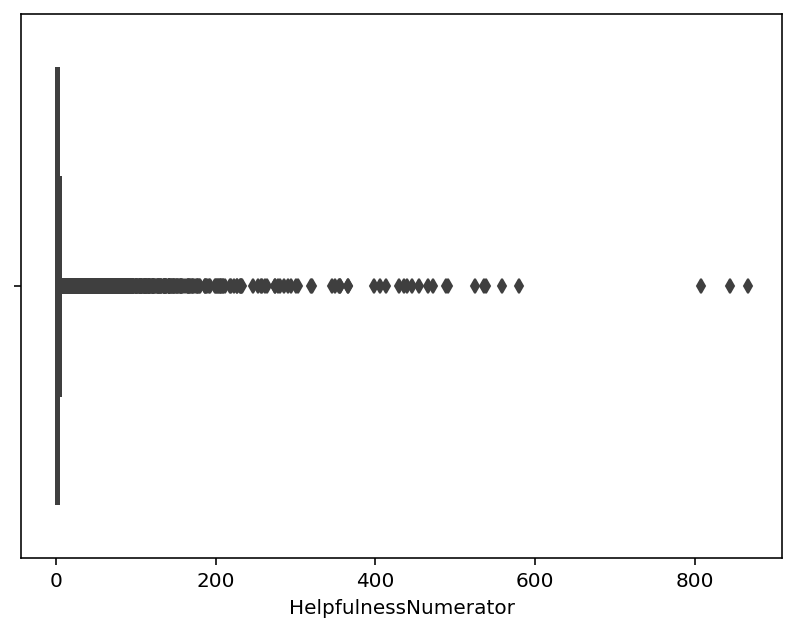

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(121)
sns.boxplot(Data.HelpfulnessNumerator);

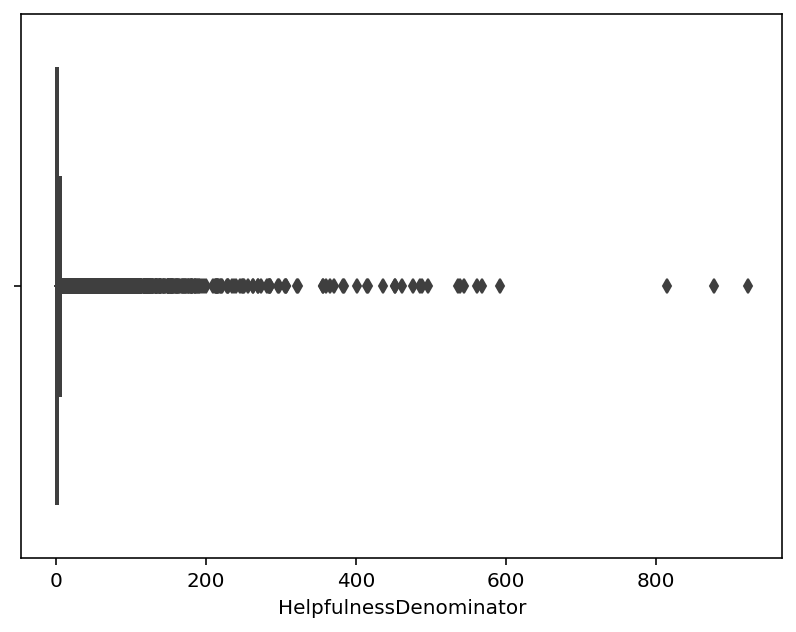

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(121)
sns.boxplot(Data.HelpfulnessDenominator);

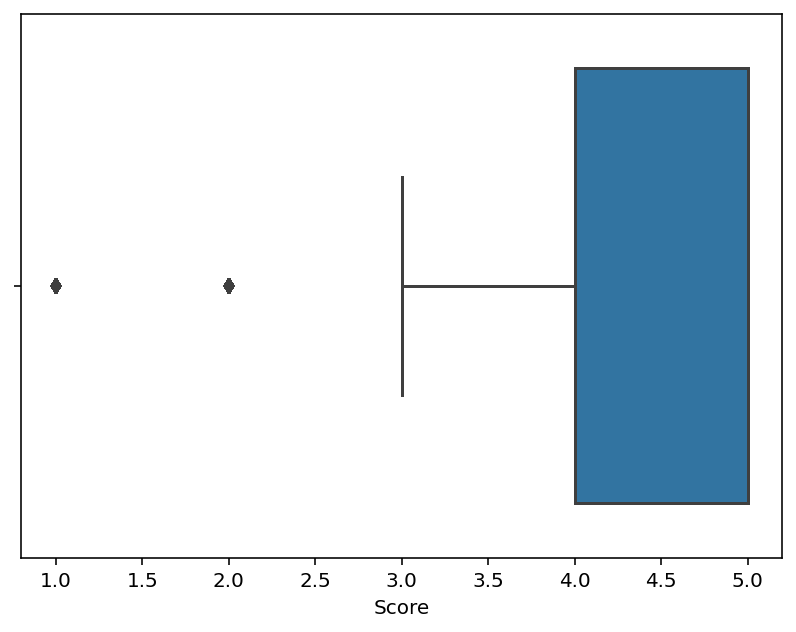

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(121)
sns.boxplot(Data.Score);

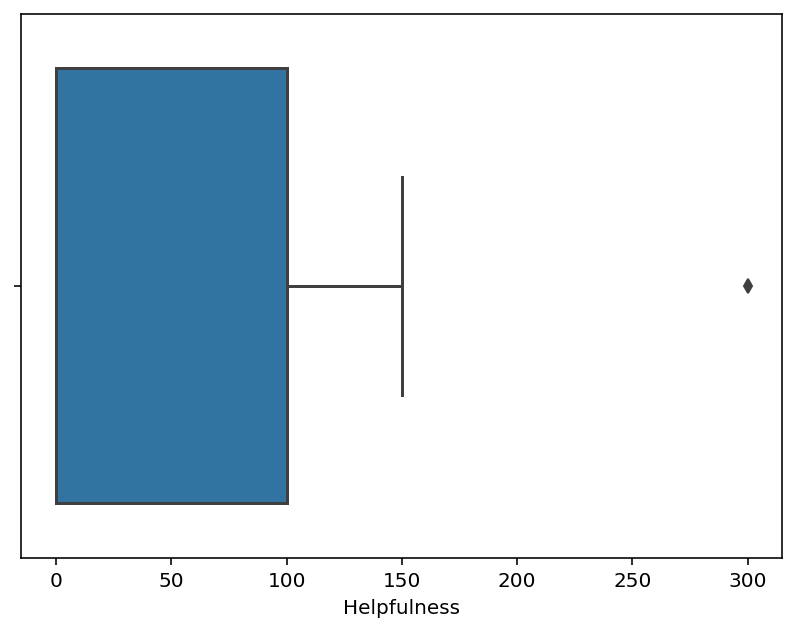

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(121)
sns.boxplot(Data.Helpfulness);


**POSITIVE AND NEGATIVE SCORE**

In [ ]:
# Considering Score values above 3 as positive, and below 3 as negative 
Data.loc[Data['Score']<3, 'Score']=0
Data.loc[Data['Score']>3, 'Score']=1

In [ ]:
# Dropping values where Score=3 (Neutral reviews)
Data=Data[Data['Score']!=3]

In [ ]:
Data.shape

(365861, 10)

In [ ]:
Data['Score'].value_counts()

1    308228
0     57633
Name: Score, dtype: int64

This indicates there are 30,8228 negative reviews, and 57633 positive reviews out of 365861 values.

### **DATA VIZUALIZATION**

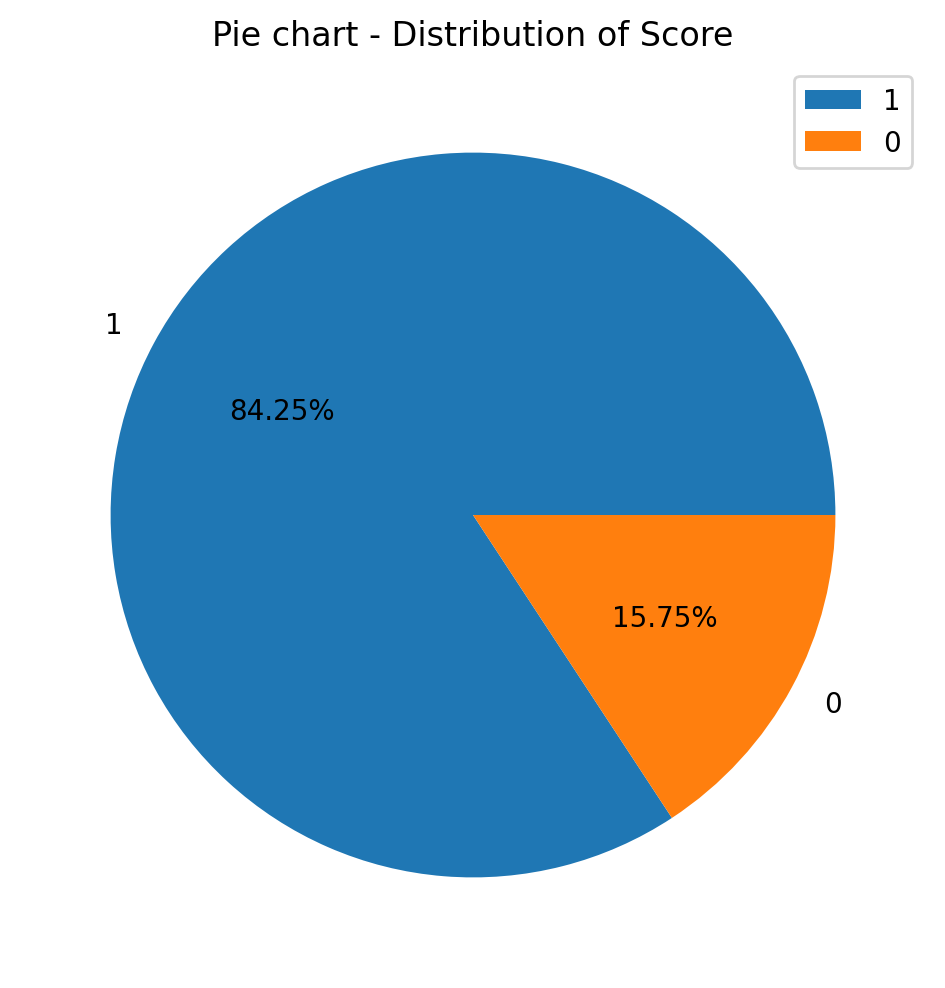

In [ ]:
plt.figure(figsize=(6,6),dpi=100)
plt.pie(x=Data.Score.value_counts().values,labels=Data.Score.value_counts().index,autopct="%.2f%%")
plt.title("Pie chart - Distribution of Score")
plt.legend(loc='upper right');

We see that the proportion of positive reviews is 84.25%

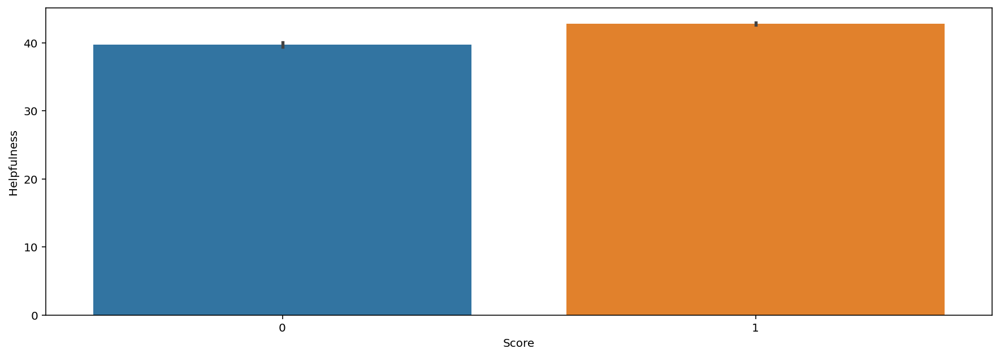

In [ ]:
plt.figure(figsize=(15,5))
sns.barplot(x = 'Score' , y ='Helpfulness' , data = Data,);

### **DATA PREPARATION - TEXT PREPROCESSING**

In [ ]:
import sklearn

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet') ## Applied before using lemmatizer (to preserve human reseability)
nltk.download('omw-1.4')
import re
from nltk.tokenize import word_tokenize ## Used to tokenize/split words 
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [ ]:
## initialise the inbuilt Stemmer
stemmer = PorterStemmer()

## initialise the inbuilt Lemmatizer
lemmatizer = WordNetLemmatizer()

In [ ]:
def preprocess(raw_text, flag):
    # Removing special characters and digits
    sentence = re.sub("[^a-zA-Z]", " ", raw_text)
    
    # change sentence to lower case
    sentence = sentence.lower()

    # tokenize into words
    tokens = sentence.split()
    
    # remove stop words                
    clean_tokens = [t for t in tokens if not t in stopwords.words("english")]
    
    # Stemming/Lemmatization
    if(flag == 'stem'):
        clean_tokens = [stemmer.stem(word) for word in clean_tokens]
    else:
        clean_tokens = [lemmatizer.lemmatize(word) for word in clean_tokens]
    
    return pd.Series([" ".join(clean_tokens)])

In [ ]:
from tqdm import tqdm, tqdm_notebook

In [ ]:
tqdm.pandas()

In [ ]:
Data1=Data[['ReviewText','Score']]

In [ ]:
Data1.duplicated().value_counts()

False    361806
True       4055
dtype: int64

In [ ]:
Data1.drop_duplicates(inplace=True)

In [ ]:
Data1.duplicated().value_counts()

False    361806
dtype: int64

In [ ]:
Data1.isna().sum()

ReviewText    0
Score         0
dtype: int64

In [ ]:
Data.head()

,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText,Helpfulness
0,0006641040,AMX0PJKV4PPNJ,"E. R. Bird ""Ramseelbird""",71,72,1,1096416000,Read it once. Read it twice. Reading Chicken ...,"These days, when a person says, ""chicken soup...",98.611111
1,0006641040,A2P4F2UO0UMP8C,"Elizabeth A. Curry ""Lovely Librarian""",0,0,1,1096675200,MMMM chicken soup....,Summary,0.000000
2,0006641040,A25ACLV5KPB4W,"Matt Hetling ""Matt""",0,1,1,1108425600,"Nice cadence, catchy rhymes",In June<br />I saw a charming group<br />of r...,0.000000
3,0006641040,ASH0DZQQF6AIZ,tessarat,0,0,1,1325721600,A classic,I remembered this book from my childhood and ...,0.000000
4,0006641040,A1S4A3IQ2MU7V4,"sally sue ""sally sue""",1,1,1,1191456000,chicken soup with rice months,This is a fun way for children to learn their...,100.000000


In [ ]:
# temp_df = Data1['ReviewText'].progress_apply(lambda x: preprocess(x, 'lemma'))   

100%|██████████| 361804/361804 [1:04:43<00:00, 93.17it/s] 


In [ ]:
# temp_df.to_csv('/content/drive/MyDrive/temp_review_data.csv')

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/temp_review_data.csv',index_col=0)

In [ ]:
df.head()

,0
230882,day person say chicken soup probably going fol...
344068,summary
532164,june br saw charming group br rose begin br dr...
251100,remembered book childhood got kid good remembe...
7304,fun way child learn month year learn poem thro...


In [ ]:
df.columns=['Review_clean_Text']
df.duplicated().sum()

918

In [ ]:
df.head()

,Review_clean_Text
230882,day person say chicken soup probably going fol...
344068,summary
532164,june br saw charming group br rose begin br dr...
251100,remembered book childhood got kid good remembe...
7304,fun way child learn month year learn poem thro...


In [ ]:
df['Score']=Data1['Score']

In [ ]:
df.head()

,Review_clean_Text,Score
230882,day person say chicken soup probably going fol...,1.0
344068,summary,1.0
532164,june br saw charming group br rose begin br dr...,NaN
251100,remembered book childhood got kid good remembe...,1.0
7304,fun way child learn month year learn poem thro...,1.0


In [ ]:
df.duplicated().sum()

513

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.isna().sum()

Review_clean_Text         3
Score                131392
dtype: int64

In [ ]:
df.dropna(inplace=True)

In [ ]:
df.isna().sum()

Review_clean_Text    0
Score                0
dtype: int64

**DATA PREPARATION - TRAIN AND TEST SPLIT**

In [ ]:
import sklearn

# Identifying the inputs (X) and output (y)

y = df['Score']
X = df[['Review_clean_Text']]

In [ ]:
# split into train and test

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, random_state=420)

X_train.head()

,Review_clean_Text
82253,peanut bar around year within past year become...
83310,recently started seeing acupuncturist among ma...
245100,first living thailand month like one would get...
74775,buying product regularly several year local so...
87036,nothing grew purchased grow anything dont even...


In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape,y_test.shape)

(172422, 1) (172422,)
(57475, 1) (57475,)


### **WordCloud**

In [ ]:
from wordcloud import WordCloud

In [ ]:
negative_df= X_train.loc[y_train==0, :]

negative_df

,Review_clean_Text
395191,cat turned year old almost hathor nephrys elde...
15658,god almighty pretty much sum sauce br br looki...
190629,love marshmellow soft fluffy touch melt mouth ...
292160,got cereal suppose heathly alternative suppose...
343808,used use regular hershey cocoa reading review ...
...,...
128288,attempting avoid aspartame flavored drink foun...
233429,celiac miss alot favorite food giving oatmeal ...
223315,deployed afghanistan get little tired eating c...
205574,one senseo coffeemakers requires coffee pod ra...


In [ ]:
words = ' '.join(negative_df['Review_clean_Text'])

print(words[:100])

cat turned year old almost hathor nephrys elder kitty bad urinary tract infection buy pruina vetrina


In [ ]:
negative_df = X_train.loc[y_train==0, :]

words = ' '.join(negative_df['Review_clean_Text'])

cleaned_word = " ".join([word for word in words.split() 
                        if 'subject' not in word])

In [ ]:
cleaned_word

'amazon browsing peanut flour saw come bought couple month ago local grocery store horrible gross nasty buy taste nothing like peanut butter almost greasy texture reminds olean something indigestible blow intestine received pack tube one tube showing lot leakage obviously food product opened damaged never consumed sadly seller offer replacement claim responsibility damage luck think product damaged shipping shipping product box tact tube leaked inside undamaged box paste fresh rather dried outside tube probably sat way shelf never checked shipping br br one le tomato goodness meal least tube squeeze think would purchase food product online definitely seller check product shipping offer replacement used love mayo ordered shop save got twice year last two shipment disappointment strong soybean oil taste know process changed thought might one shipment last batch tasted well longer order cutter oz backyard bug control spray concentrate longer effective used able spray yard mosquito would d

In [ ]:
negative_wordcloud = WordCloud(stopwords=stopwords.words("english"),
                      background_color='black',
                      width=1600,
                      height=800
                     ).generate(cleaned_word)

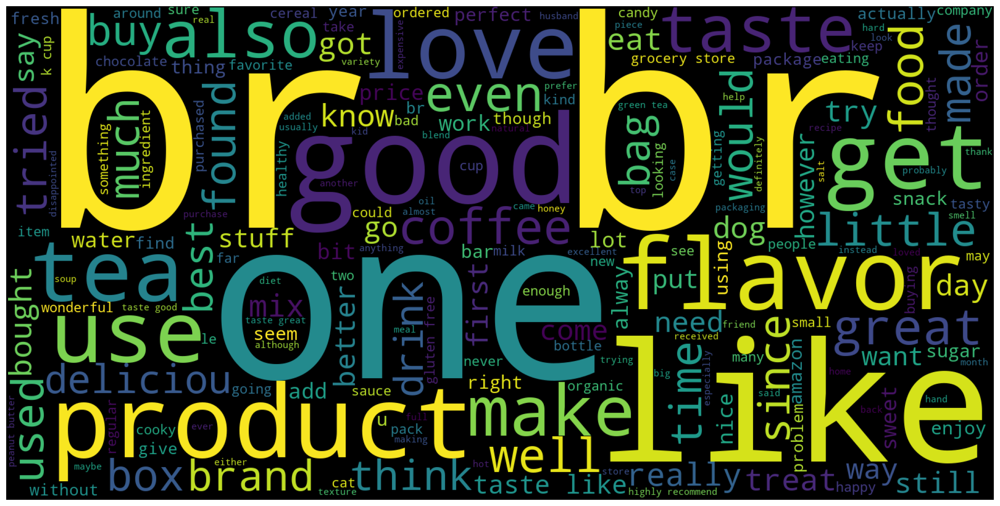

In [ ]:
plt.figure(1,figsize=(20,20))
plt.imshow(negative_wordcloud )
plt.axis('off')
plt.show();

In [ ]:
positive_df = X_train.loc[y_train==1, :]

words = ' '.join(positive_df['Review_clean_Text'])

cleaned_word = " ".join([word for word in words.split() 
                        if 'subject' not in word])

In [ ]:
positive_wordcloud = WordCloud(stopwords=stopwords.words("english"),
                      background_color='black',
                      width=1600,
                      height=800
                     ).generate(cleaned_word);

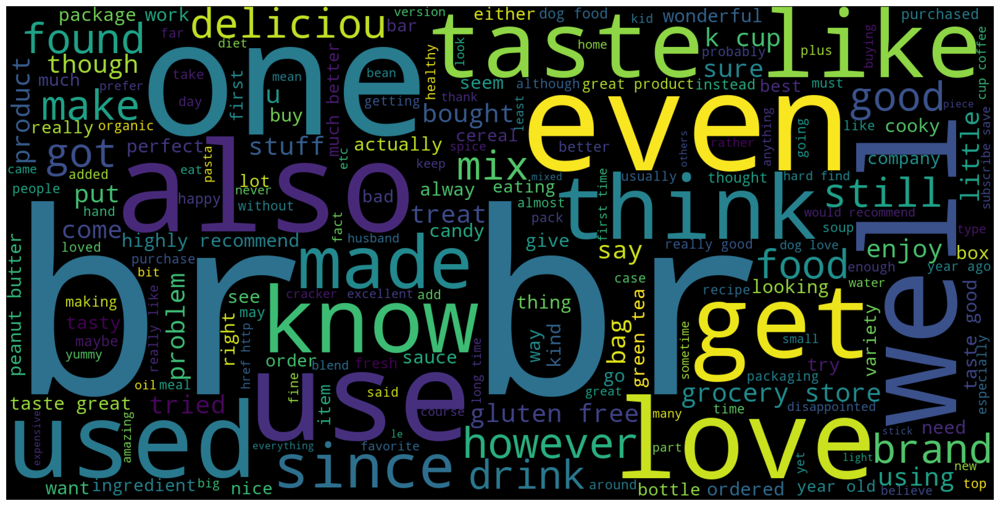

In [ ]:
plt.figure(1,figsize=(20,20))
plt.imshow(positive_wordcloud)
plt.axis('off')
plt.show();

**CONVERTING TEXT TO NUMERICAL VECTORS - BOW REPRESENTATION**

In [ ]:
X_train.head()

,Review_clean_Text
82253,peanut bar around year within past year become...
83310,recently started seeing acupuncturist among ma...
245100,first living thailand month like one would get...
74775,buying product regularly several year local so...
87036,nothing grew purchased grow anything dont even...


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
vocab = CountVectorizer()
X_train_bow= vocab.fit_transform(X_train['Review_clean_Text'])

In [ ]:
X_test_bow = vocab.transform(X_test['Review_clean_Text'])

In [ ]:
print("Total unique words:", len(vocab.vocabulary_))
print("Shape of input data:", X_train_bow.shape)

Total unique words: 61866
Shape of input data: (172422, 61866)


## **EVALUATION**
### **Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression()
classifier.fit(X_train_bow, y_train)

LogisticRegression()

In [ ]:
y_test_pred = classifier.predict(X_test_bow)

In [ ]:
from sklearn import metrics

logistic_regression_accuracy= metrics.accuracy_score(y_test, y_test_pred)
logistic_regression_accuracy

0.8343975641583297

### **KNN Classifier**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier()
classifier.fit(X_train_bow, y_train)

KNeighborsClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_bow)

In [ ]:
KNN_Classifier_accuracy=metrics.accuracy_score(y_test, y_test_pred)
KNN_Classifier_accuracy

0.8291605045672031


### **DT Classifier**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier()
classifier.fit(X_train_bow, y_train)

DecisionTreeClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_bow)

In [ ]:
from sklearn import metrics

DT_Classifier_accuracy=metrics.accuracy_score(y_test, y_test_pred)
DT_Classifier_accuracy

0.7533188342757721

### **Random Forest Classifier**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier()
classifier.fit(X_train_bow, y_train)

RandomForestClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_bow)

In [ ]:
Random_forest_Classifier_accuracy=metrics.accuracy_score(y_test, y_test_pred)
Random_forest_Classifier_accuracy

0.8426794258373206

### **Gradient Boosting Classifier**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
classifier = GradientBoostingClassifier()
classifier.fit(X_train_bow, y_train)

GradientBoostingClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_bow)

In [ ]:
Gradient_Boosting_Classifier_accuracy=metrics.accuracy_score(y_test, y_test_pred)
Gradient_Boosting_Classifier_accuracy

0.8437929534580252

### **ADA Boost Classifier**

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
classifier = AdaBoostClassifier()
classifier.fit(X_train_bow, y_train)

AdaBoostClassifier()

In [ ]:
y_test_pred = classifier.predict(X_test_bow)

In [ ]:
ADA_Boost_Classifier_accuracy=metrics.accuracy_score(y_test, y_test_pred)
ADA_Boost_Classifier_accuracy

0.8438277511961723

### **RESULTS**

In [ ]:
logistic_regression_accuracy=0.8343975641583297
KNN_Classifier_accuracy=0.8291605045672031
DT_Classifier_accuracy=0.7533188342757721
Random_forest_Classifier_accuracy = 0.8426794258373206
Gradient_Boosting_Classifier_accuracy= 0.8437929534580252
ADA_Boost_Classifier_accuracy= 0.8438277511961723

In [ ]:
Results = pd.DataFrame({"Algorithm": ["AdaBoostClassifier","GradientBoostingClassifier", "RandomForestClassifier","LogisticRegression","KNeighborsClassifier", 
                                      "DecisionTreeClassifier"],
                                 
           "Accuracy": [ADA_Boost_Classifier_accuracy,Gradient_Boosting_Classifier_accuracy,Random_forest_Classifier_accuracy, logistic_regression_accuracy, 
                                   KNN_Classifier_accuracy,DT_Classifier_accuracy]})
Results

,Algorithm,Accuracy
0,AdaBoostClassifier,0.843828
1,GradientBoostingClassifier,0.843793
2,RandomForestClassifier,0.842679
3,LogisticRegression,0.834398
4,KNeighborsClassifier,0.829161
5,DecisionTreeClassifier,0.753319


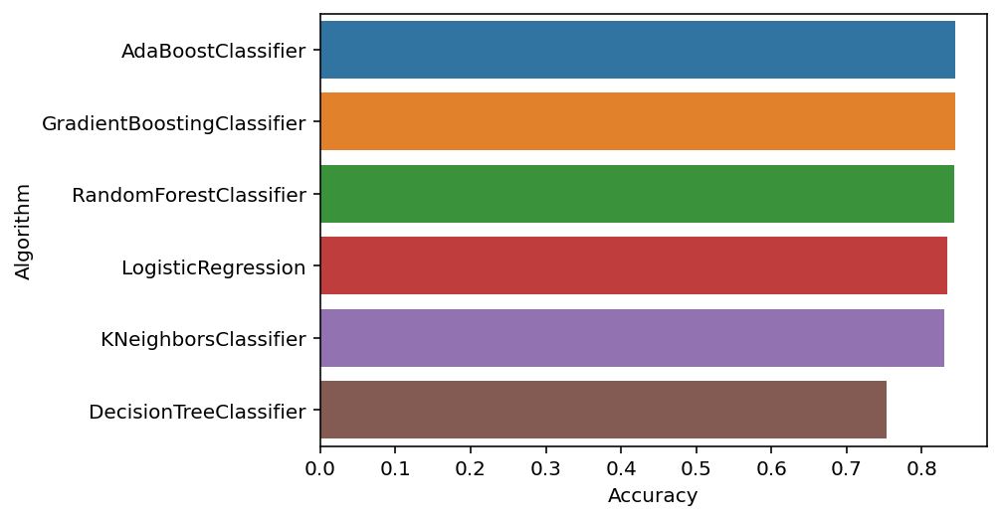

In [ ]:
import seaborn as sns

sns.barplot(y=Results.Algorithm,x=Results.Accuracy);

### **OBSERVATION**

Maximum Accuracy (84.38%) was observed on application of ADA Boost Classifier. Hence, this algorithm is recommended for solving this problem